- Definitions  
- Use cases  
- How it works (intuitively and mathematically)  
- Formulae  
- Example (with explanation)  
- Key assumptions  
- Advantages & Limitations  

---

### 📌 **Logistic Regression – Theory and Explanation**

---

## 📘 What is Logistic Regression?

**Logistic Regression** is a **supervised learning algorithm** used for **classification problems**. It is used to **predict the probability** of a **binary outcome (0 or 1, True or False, Yes or No)** based on one or more independent variables.

It belongs to the family of **Generalized Linear Models (GLM)**.

---

## 🎯 Use Cases of Logistic Regression

- Predicting whether an email is spam (1) or not (0)  
- Disease prediction – whether a patient has diabetes (1) or not (0)  
- Customer churn prediction – will a customer leave the company or not  
- Loan default prediction  
- Click-through rate prediction in digital ads  

---

## ⚙️ How Does Logistic Regression Work?

Unlike Linear Regression, which predicts continuous values, **Logistic Regression predicts probabilities**. Since probabilities must lie between 0 and 1, it uses a **Sigmoid Function** to "squash" the output of a linear equation into a [0,1] range.


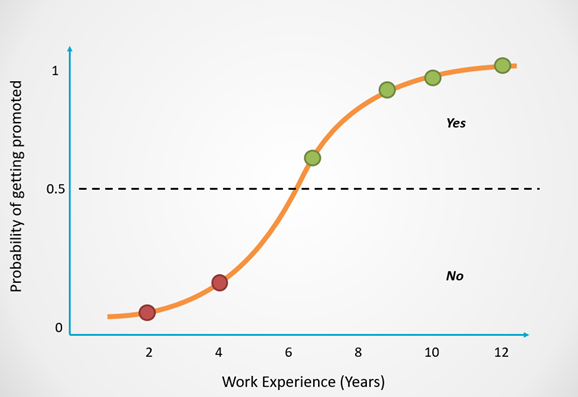

---

### 🧮 Step-by-Step Working:

1. **Linear Combination (Z)**  
   
   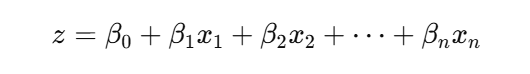

2. **Apply the Sigmoid Function**  
   
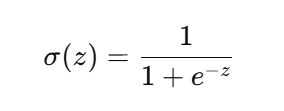

   This gives us the **predicted probability** of the outcome being class 1.

3. **Decision Rule (Classification)**  
   
   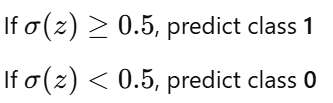

---

## 📈 The Sigmoid Function

The sigmoid function outputs values between 0 and 1:

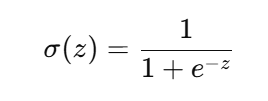

- If z is a large positive number → output close to 1  
- If z is a large negative number → output close to 0  
- If z = 0 → output = 0.5

---

## 📊 Example

Let’s say we are predicting whether a student will pass (1) or fail (0) an exam based on the number of hours they studied.

Let:

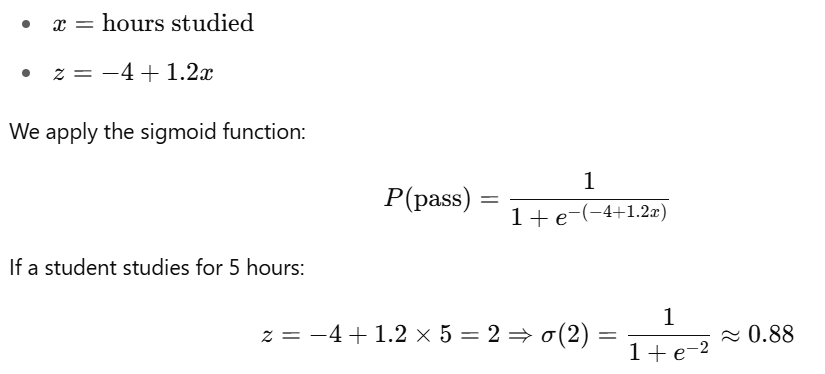

So, the probability of passing = **88%**, we classify this student as "Will Pass" (1).
---

## ✅ Assumptions of Logistic Regression

- The dependent variable is binary  
- Observations are independent  
- No or little multicollinearity among independent variables  
- A linear relationship exists between the independent variables and the log-odds of the dependent variable

---

## ⭐ Key Points

- Logistic Regression is used for **binary classification**  
- Uses **sigmoid function** to output probabilities  
- Decision threshold typically is **0.5** (can be tuned)    

---

## 🔍 Advantages of Logistic Regression

- Simple and easy to implement  
- Works well for linearly separable data  
- Outputs probabilities, useful for ranking  
- Less prone to overfitting when regularized

---

## ⚠️ Limitations

- Assumes linear relationship between input and log-odds  
- Doesn’t work well with complex, non-linear data  
- Sensitive to outliers and irrelevant features  

---

## 📌 Logistic Regression vs Linear Regression

| Feature | Linear Regression | Logistic Regression |
|--------|-------------------|---------------------|
| Output | Continuous         | Probability (0-1)   |
| Algorithm Type | Regression | Classification      |
| Function Used | Identity function (y = mx + b) | Sigmoid function |
| Cost Function | MSE (Mean Squared Error) | Log Loss |

---

# Handson of Logistic Regression

In [ ]:
# Step - 1 ( Importing libraries )
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Step -2 ( Upload dataset )
df = pd.read_csv("bank.csv", sep=";")  # sep=";" To properly seperate the data
#https://drive.google.com/file/d/1JRZcQJLZvcijMtrztTJrsEExoeFqp8b3/view?usp=sharing
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41194,74.0,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41195,74.0,NaN,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41196,74.0,retired,married,NaN,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# I need to print my full data ( all rows and all columns )
print(df.to_string())

        age            job   marital            education  default  housing     loan    contact month day_of_week  duration  campaign  pdays  previous     poutcome  emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed    y
0      56.0      housemaid   married             basic.4y       no       no       no  telephone   may         mon     261.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
1      57.0       services   married          high.school  unknown       no       no  telephone   may         mon     149.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
2      37.0       services   married          high.school       no      yes       no  telephone   may         mon     226.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
3      40.0         admin.   married            

In [ ]:
# Check the summary info

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41199 entries, 0 to 41198
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41195 non-null  float64
 1   job             41194 non-null  object 
 2   marital         41194 non-null  object 
 3   education       41194 non-null  object 
 4   default         41195 non-null  object 
 5   housing         41196 non-null  object 
 6   loan            41195 non-null  object 
 7   contact         41195 non-null  object 
 8   month           41196 non-null  object 
 9   day_of_week     41196 non-null  object 
 10  duration        41196 non-null  float64
 11  campaign        41196 non-null  float64
 12  pdays           41196 non-null  float64
 13  previous        41196 non-null  float64
 14  poutcome        41194 non-null  object 
 15  emp.var.rate    41196 non-null  float64
 16  cons.price.idx  41195 non-null  float64
 17  cons.conf.idx   41196 non-null 

In [ ]:
# I want to print all the column names
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [ ]:
# EDA - Exploratory Data Analysis
'''
Data Cleaning

1) Check for Null / Missing values
2) Check for Dupicate records
3) Check for Outliers
'''

'\nData Cleaning\n\n1) Check for Null / Missing values\n2) Check for Dupicate records\n3) Check for Outliers\n'

In [ ]:
# Check for Null / Missing values

df.isnull().sum()

,0
age,4
job,5
marital,5
education,5
default,4
housing,3
loan,4
contact,4
month,3
day_of_week,3


In [ ]:
df.isnull().sum().sum()  # Total count of null values

np.int64(76)

In [ ]:
df.shape

(41199, 21)

#How to decide whether to DROP the null values or to REPLACE the null values

**If the count of null values is less than 30% of your data = DROP**

**If the count of null values is more than 30% of your data = REPLACE**

In [ ]:
# How to drop the Null values
df.dropna(inplace=True)

In [ ]:
df.isnull().sum().sum()  # Total count of null values

np.int64(0)

In [ ]:
(76/41199)*100  # we are having 0.18% of Null values

0.18447049685671982

In [ ]:
# How to Replace the Null values

**By which value we should Replace ?**

**If null value is there in numerical data type column ( int64 , float64)   = Replace with Mean or Median of that column**

**If null value is there in String data type column ( object64)   = Replace with Mode of that column**

In [ ]:
for i in df.columns:  # I will use for loop to access all the columns
  if df[i].dtype =="object":   # If the data type of column is object REPLACE WITH MODE
    df[i].fillna(df[i].mode()[0] , inplace=True)
  else:                        # If the data type of column is numerical REPLACE WITH MEAN OR MEDIAN
    df[i].fillna(df[i].mean() , inplace=True)

df.head(10)

<ipython-input-19-5485dd5b4348>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[i].fillna(df[i].mean() , inplace=True)
<ipython-input-19-5485dd5b4348>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.m

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
5,45.0,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
6,59.0,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
7,41.0,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
8,24.0,technician,single,professional.course,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25.0,services,single,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
df["marital"].mode()  # It will give the outpur like a dataframe

,marital
0,married


In [ ]:
df["marital"].mode()[0]  # To directly get the most common value that i can fill in place of null value

'married'

In [ ]:
df.shape

(41190, 21)

In [ ]:
# Check for Duplicate values
print(df.duplicated().sum())

13


In [ ]:
# Delete the duplicate record
df.drop_duplicates(inplace=True)

In [ ]:
# Check for Duplicate values
print(df.duplicated().sum())

0


In [ ]:
df.shape

(41177, 21)

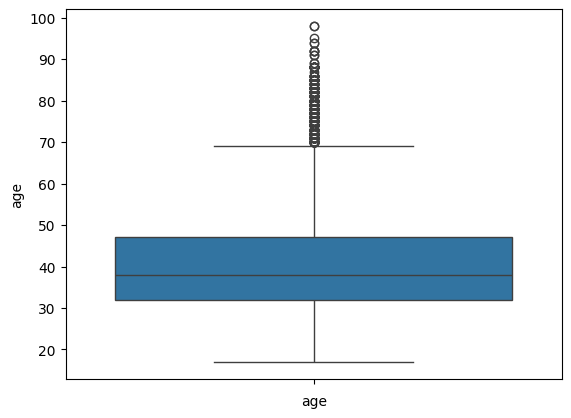

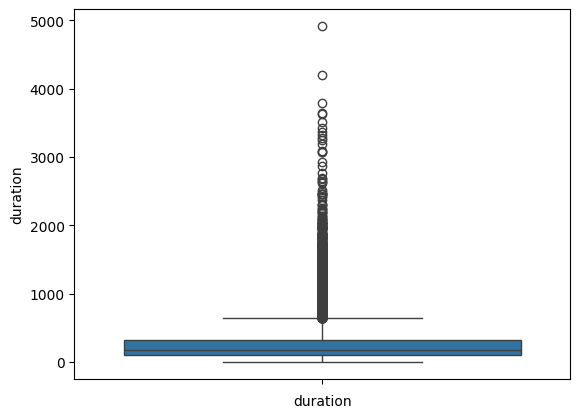

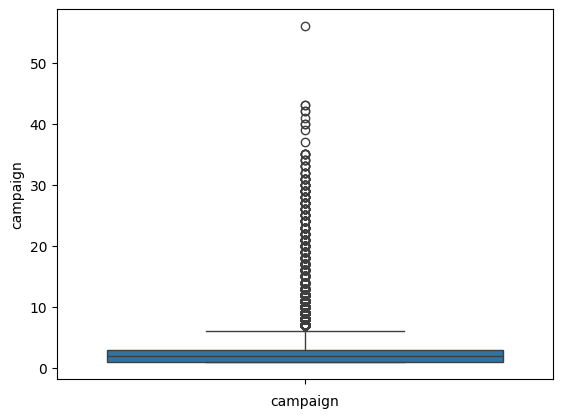

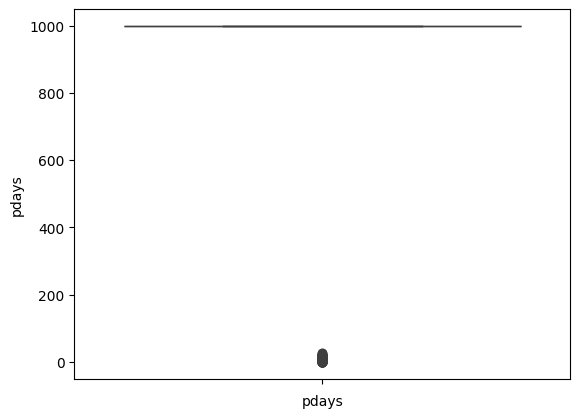

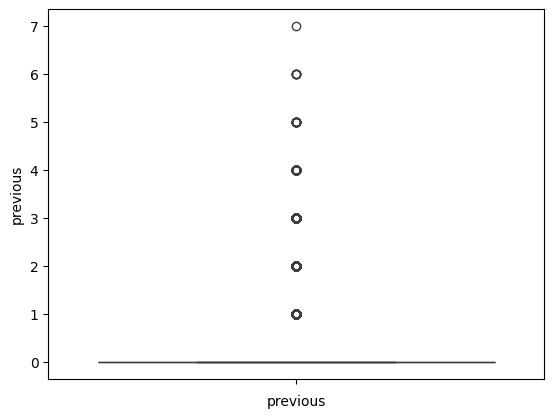

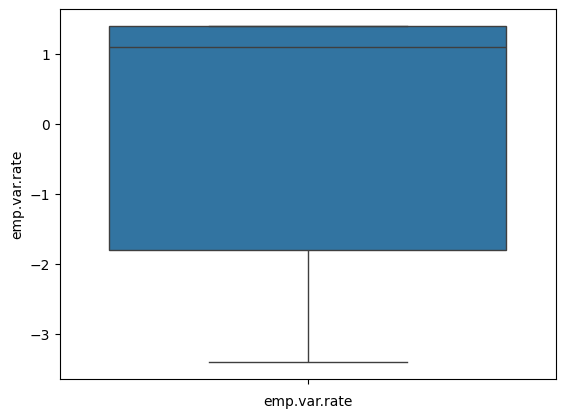

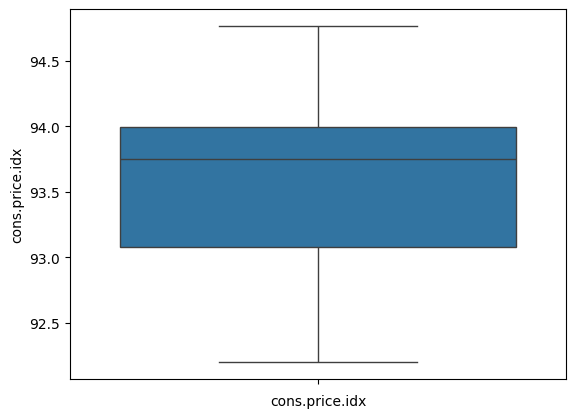

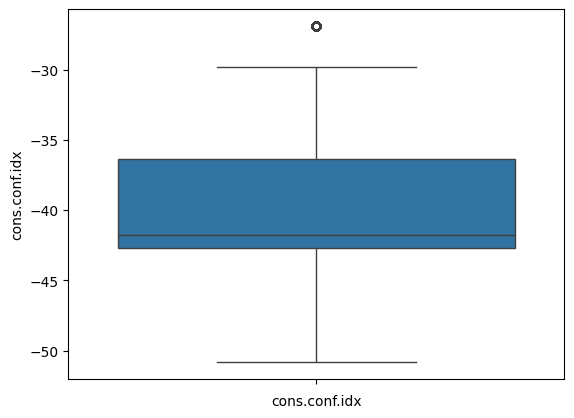

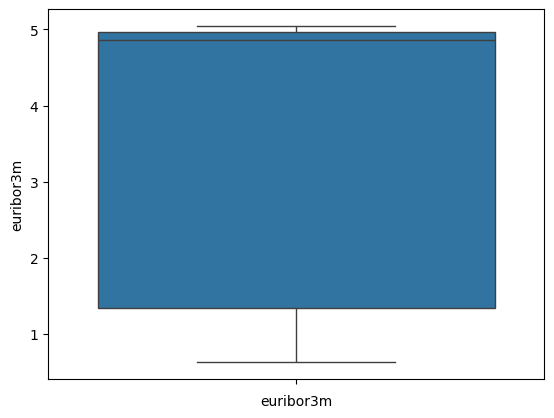

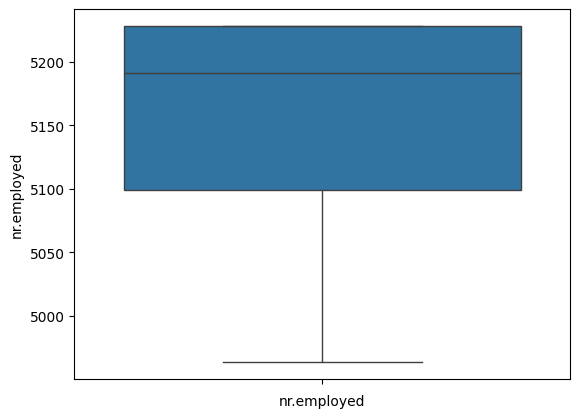

In [ ]:
# Check for Outliers
for i in df.columns:
  if df[i].dtype=="int64" or  df[i].dtype=="float64" :
    sns.boxplot(df[i])
    plt.xlabel(i)
    plt.show()

In [ ]:
# Final clean data
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41184,46.0,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1.0,999.0,0.0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56.0,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2.0,999.0,0.0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44.0,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1.0,999.0,0.0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41187,74.0,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no


# 🧩 What is Encoding?
In machine learning, models work only with numeric data. So, we need to convert categorical data (text labels) into numbers. This process is called encoding.


**Label Encoding is a basic encoding technique where each unique category is assigned a unique integer depending on Alphabetical order**

In [ ]:
# OLD data
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41184,46.0,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1.0,999.0,0.0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56.0,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2.0,999.0,0.0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44.0,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1.0,999.0,0.0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41187,74.0,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()  # Labele encoder to convert categorical values to numerical values

In [ ]:
# Select all string data type column and apply labelencoding to them
for i in df.columns:
  if df[i].dtype=="object":
    df[i]=le.fit_transform(df[i])

In [ ]:
# New data
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,3,1,0,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57.0,7,1,3,1,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37.0,7,1,3,0,2,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40.0,0,1,1,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56.0,7,1,3,0,0,2,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41184,46.0,1,1,5,0,0,0,0,7,0,...,1.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6,0
41185,56.0,5,1,6,0,2,0,0,7,0,...,2.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6,0
41186,44.0,9,1,5,0,0,0,0,7,0,...,1.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6,1
41187,74.0,5,1,5,0,2,0,0,7,0,...,3.0,999.0,1.0,0,-1.1,94.767,-50.8,1.028,4963.6,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41177 entries, 0 to 41193
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41177 non-null  float64
 1   job             41177 non-null  int64  
 2   marital         41177 non-null  int64  
 3   education       41177 non-null  int64  
 4   default         41177 non-null  int64  
 5   housing         41177 non-null  int64  
 6   loan            41177 non-null  int64  
 7   contact         41177 non-null  int64  
 8   month           41177 non-null  int64  
 9   day_of_week     41177 non-null  int64  
 10  duration        41177 non-null  float64
 11  campaign        41177 non-null  float64
 12  pdays           41177 non-null  float64
 13  previous        41177 non-null  float64
 14  poutcome        41177 non-null  int64  
 15  emp.var.rate    41177 non-null  float64
 16  cons.price.idx  41177 non-null  float64
 17  cons.conf.idx   41177 non-null  floa

In [ ]:
#print(df.to_string())

# 🔍 What is RFE (Recursive Feature Elimination)?

**RFE is a feature selection technique** used to choose the most important features for a predictive model by recursively removing less significant features.

When using Logistic Regression, RFE helps improve model performance by reducing overfitting and increasing interpretability.

# 🧠 How Does RFE Work? (Step-by-Step)
Start with all features in your dataset.

Train a logistic regression model using all features.

Rank the features based on their importance (e.g., absolute value of coefficients).

Remove the least important feature(s).

Repeat the process with the reduced set of features.

Stop when the desired number of features is reached.

# 🧪 Why Use RFE with Logistic Regression?
Logistic Regression is sensitive to irrelevant or highly correlated features.

RFE helps select the most predictive features.

It gives a cleaner, more interpretable model.

Reduces training time and enhances generalization.



In [ ]:
# Split the data into x and y
x=df.iloc[: , :-1] # Independent variables
y=df["y"] # Dependent variable

In [ ]:
x

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56.0,3,1,0,0,0,0,1,6,1,261.0,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0
1,57.0,7,1,3,1,0,0,1,6,1,149.0,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0
2,37.0,7,1,3,0,2,0,1,6,1,226.0,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0
3,40.0,0,1,1,0,0,0,1,6,1,151.0,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0
4,56.0,7,1,3,0,0,2,1,6,1,307.0,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41184,46.0,1,1,5,0,0,0,0,7,0,383.0,1.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6
41185,56.0,5,1,6,0,2,0,0,7,0,189.0,2.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6
41186,44.0,9,1,5,0,0,0,0,7,0,442.0,1.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6
41187,74.0,5,1,5,0,2,0,0,7,0,239.0,3.0,999.0,1.0,0,-1.1,94.767,-50.8,1.028,4963.6


In [ ]:
y  # Whether we can give a Loan or not , 0 = No , 1 = Yes !

,y
0,0
1,0
2,0
3,0
4,0
...,...
41184,0
41185,0
41186,1
41187,0


In [ ]:
# Apply RFE on your Indepdendent column / features to select the import ones only !
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
model1 = LogisticRegression()  # Create a logistic regression model so we can try RFE on this to select import feature for FINAL MODEL

rfe = RFE(model1)  # Apply RFE on the model that you have created
rfe.fit(x,y)  # Pass your indepenetn and dependent data to RFE for doing feature selection

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

RFE(estimator=LogisticRegression())

In [ ]:
# RFE will give me the index of the columns that are important BUT i need column names

# Create a list of column names so when RFE will give me the index of important column i can use this list to get the column names
column_name = x.columns
column_name

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

In [ ]:
important_column_index = [ i for i , data in enumerate(rfe.support_) if data ==True]
# Index of the column that are important
important_column_index

[2, 4, 7, 9, 11, 13, 14, 15, 17, 18]

In [ ]:
# Use index to get the name of important columns
selected_Columns_name = [column_name[i] for i in important_column_index ]
selected_Columns_name

['marital',
 'default',
 'contact',
 'day_of_week',
 'campaign',
 'previous',
 'poutcome',
 'emp.var.rate',
 'cons.conf.idx',
 'euribor3m']

In [ ]:
# Use the column provided by rfe as your independent column to make the prediction about your dependent column
x=x.loc[: , ['marital',
 'default',
 'contact',
 'day_of_week',
 'campaign',
 'previous',
 'poutcome',
 'emp.var.rate',
 'cons.conf.idx',
 'euribor3m'] ]

y=df["y"]

In [ ]:
# Split the data into training and testing
from sklearn.model_selection import train_test_split
'''
train means Training data
test means Testing data

x means Independent variable
y means Dependent variable

x_train = Independent variable of Training data
y_train = Dependent variable of Training data

x_test = Independent variable of Testing data
y_test = Dependent variable of Testing data
'''
x_train , x_test , y_train , y_test = train_test_split( x , y , test_size=0.2 , random_state=0)

In [ ]:
# Build a logsitic regression model
final_model = LogisticRegression()

# Train the model by passing both ques and ans of training data
final_model.fit(x_train,y_train)

# Ask my model to make the prediction by giving Independent variable of testing data which is unseen to my model
y_pred = final_model.predict(x_test)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Compare the predicted value (y_pred) with your Actual loan value (y_test)

# Actual loan value
y_test

,y
26954,0
11804,0
28491,0
31601,0
18459,0
...,...
5109,0
11260,0
20279,0
27206,0


In [ ]:
# Predicted loan value
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# In Logsitic regression you will use Accuracy score to evalaute the performance of your model
from sklearn.metrics import accuracy_score
print("Accuracy score of Logistic regression model is :", accuracy_score(y_pred , y_test)*100)

Accuracy score of Logistic regression model is : 90.00728508984945


In [ ]:
from sklearn.metrics import precision_score
print("Precision score of Logistic regression model is :", precision_score(y_pred , y_test)*100)

Precision score of Logistic regression model is : 18.40958605664488


In [ ]:
from sklearn.metrics import recall_score
print("Recall score of Logistic regression model is :", recall_score(y_pred , y_test)*100)

Recall score of Logistic regression model is : 69.54732510288066


In [ ]:
from sklearn.metrics import f1_score
print("F1 score  score of Logistic regression model is :", f1_score(y_pred , y_test)*100)

F1 score  score of Logistic regression model is : 29.112833763996555


In [ ]:
# CONFUSION MATRIX
from sklearn.metrics import confusion_matrix
'''
             Predicted
              0        1
        0   7244      74
Actual
        1   749       169
-----------------------------------
             Predicted
              0        1
        0    TN       FP
Actual
        1    FN       TP
'''

confusion_matrix(y_test , y_pred)

array([[7244,   74],
       [ 749,  169]])

In [ ]:
# Find the accuracy score manually
'''
Accuracy = TP+TN / TP+FP+TN+FN
Accuracy = 7244 +169 / 7244+169+74+749
Accuracy = 90.00728508984944
'''

In [ ]:
7244 +169

7413

In [ ]:
7244+169+74+749

8236

In [ ]:
7413/8236

0.9000728508984944

# 🔍 Model Evaluation Metrics in Logistic Regression
After training a Logistic Regression model, we use various metrics to evaluate how well it performs. Each metric gives us different insights about the model's strengths and weaknesses, especially for classification tasks like loan approval.

# ✅ 1. Accuracy
Definition:
Accuracy tells us how many predictions the model got correct out of all predictions made.

Formula:
Accuracy = (True Positives + True Negatives) / (Total Predictions)

Use Case:
Accuracy is useful when the dataset is balanced — i.e., when both classes (loan approved and not approved) have almost equal number of records.

# 🎯 2. Precision
Definition:
Precision tells us how many of the predicted "loan approved" cases were actually correct. It focuses on how accurate your positive predictions are.

Formula:
Precision = True Positives / (True Positives + False Positives)

Use Case:
Precision is important when False Positives are costly.
For example, giving a loan to someone who shouldn't get it.

# 📢 3. Recall (Sensitivity / True Positive Rate)
Definition:
Recall tells us how many of the actual "loan approved" cases we were able to identify correctly. It focuses on catching all the positives.

Formula:
Recall = True Positives / (True Positives + False Negatives)

Use Case:
Recall is important when False Negatives are costly.
For example, rejecting a loan to someone who was actually eligible.

# ⚖️ 4. F1 Score
Definition:
F1 Score is the harmonic mean of Precision and Recall. It balances both and gives a single score that considers both false positives and false negatives.

Formula:
F1 Score = 2 × (Precision × Recall) / (Precision + Recall)

Use Case:
Use F1 Score when you need a balance between Precision and Recall, especially when the dataset is imbalanced (like 90% 'No Loan', 10% 'Loan').

# 📈 5. AUC - ROC Curve
Definition:

ROC Curve (Receiver Operating Characteristic Curve) plots the True Positive Rate (Recall) against the False Positive Rate at different threshold values.

AUC (Area Under the Curve) tells us how well the model can distinguish between the classes.

Formula:
AUC = Area Under the ROC Curve (calculated from the ROC graph, not a simple formula like others)

Use Case:
AUC-ROC is great for comparing models and understanding how good a model is at all classification thresholds. AUC close to 1 = excellent model, AUC near 0.5 = poor model.

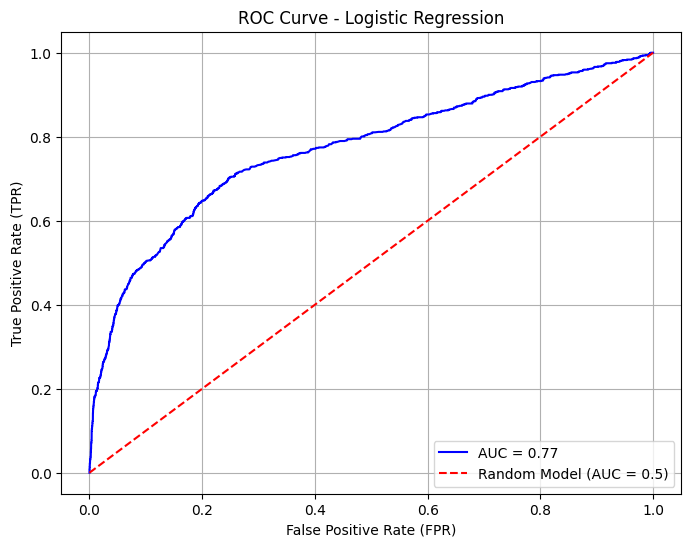

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Get predicted probabilities for the positive class (class 1)
y_proba = final_model.predict_proba(x_test)[:, 1]

# Get actual predictions (0 or 1) if needed
y_pred = final_model.predict(x_test)

# Calculate ROC Curve values
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

# Calculate AUC score
auc_score = roc_auc_score(y_test, y_proba)

# Plot the ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='AUC = {:.2f}'.format(auc_score))
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Model (AUC = 0.5)')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve - Logistic Regression')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


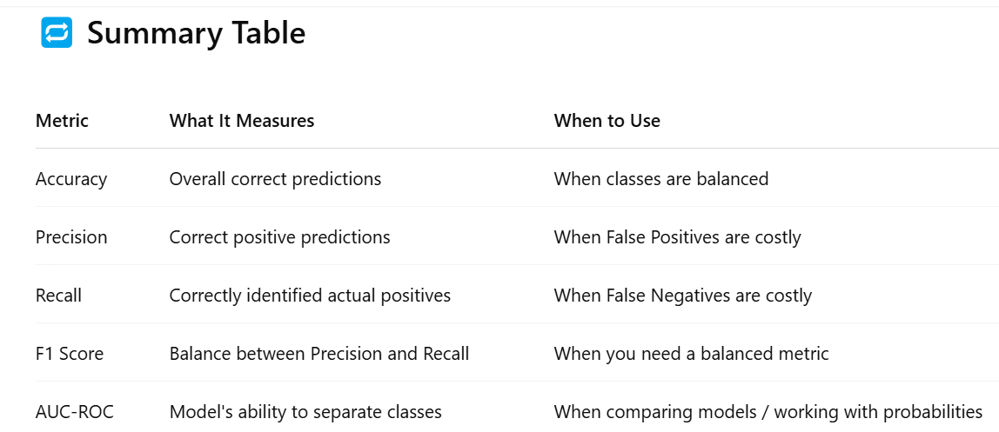

# 📌 Questions for Linear Regression

1) Import the California Housing Dataset using fetch_california_housing() and create a DataFrame.

2) Use only the following columns for independent variables:

'MedInc' (Median Income)

'AveRooms' (Average Rooms)

'HouseAge' (Age of House)

Use 'MedHouseVal' (Median House Value) as the target variable.

3) Split the data into train and test sets using:

Test size = 0.2

Random state = 42

4) Build a Linear Regression model using sklearn and train it on the training set.

5) Predict the target variable on the test set.

6) Calculate and print the following metric:

7) R² Score (coefficient of determination)

8) Plot a scatter plot showing Actual vs Predicted values for the test set.

In [ ]:
from sklearn.datasets import fetch_california_housing
import pandas as pd

# Load the dataset
housing = fetch_california_housing(as_frame=True)

# Convert to DataFrame
df = housing.frame

# Display the first few rows
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


# 📌 Questions for Logistic Regression

1) Import the Titanic dataset using the URL provided.

2) Drop any rows with missing values.

3) Convert the Sex column into numeric using:

df['Sex'] = df['Sex'].map({'male': 0, 'female': 1})

4) Use the following columns as independent variables:
['Pclass', 'Sex', 'Age', 'Fare']
Use Survived as the target variable.

5) Split the dataset into train and test sets using:

Test size = 0.25
Random state = 1

6) Train a Logistic Regression model.

7) Predict on the test set.

8) Print the following evaluation metrics:

Accuracy Score

Precision

Recall

F1 Score

9) Plot the ROC Curve and calculate the AUC Score.

In [ ]:
import pandas as pd

# Load dataset from online URL
url = "https://raw.githubusercontent.com/datasciencedojo/datasets/master/titanic.csv"
df = pd.read_csv(url)

# Display the first few rows
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
